## Configs and Hyperparameters

Support a variety of models, you can find more pretrained model from [Tensorflow detection model zoo: COCO-trained models](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md#coco-trained-models), as well as their pipline config files in [object_detection/samples/configs/](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs).

In [ ]:
# If you forked the repo, you can replace the link.
repo_url = 'https://github.com/roboflow-ai/tensorflow-object-detection-faster-rcnn'

# Number of training steps - 1000 will train very quickly, but more steps will increase accuracy.
num_steps = 40000  # 200000 to improve

# Number of evaluation steps.
num_eval_steps = 50

MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
        'batch_size': 12
    },
    'faster_rcnn_inception_v2': {
        'model_name': 'faster_rcnn_inception_v2_coco_2018_01_28',
        'pipeline_file': 'faster_rcnn_inception_v2_pets.config',
        'batch_size': 12
    },
    'rfcn_resnet101': {
        'model_name': 'rfcn_resnet101_coco_2018_01_28',
        'pipeline_file': 'rfcn_resnet101_pets.config',
        'batch_size': 8
    },    
}

# Pick the model you want to use
# Select a model in `MODELS_CONFIG`.
selected_model = 'ssd_mobilenet_v2'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colabe's Tesla K80 GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

In [ ]:
# use TF 1.x for Object Detection APIs as they are not ported to TF 2.0 yet
%tensorflow_version 1.x
import tensorflow as tf
print("You are using TensorFlow version", tf .__version__)

TensorFlow 1.x selected.


## Clone the `tensorflow-object-detection` repository or your fork.

In [ ]:
import os

%cd /content

repo_dir_path = os.path.abspath(os.path.join('.', os.path.basename(repo_url)))

!git clone {repo_url}
%cd {repo_dir_path}
!git pull

/content
Cloning into 'tensorflow-object-detection-faster-rcnn'...
remote: Enumerating objects: 885, done.
remote: Total 885 (delta 0), reused 0 (delta 0), pack-reused 885
Receiving objects: 100% (885/885), 24.83 MiB | 23.35 MiB/s, done.
Resolving deltas: 100% (428/428), done.
/content/tensorflow-object-detection-faster-rcnn
Already up to date.


## Install required packages

In [ ]:
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git

!pip install tf_slim

!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib

!pip install -q pycocotools

!pip install lvis

%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

import os
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/'

!python object_detection/builders/model_builder_test.py

/content
     |████████████████████████████████| 358kB 4.3MB/s 
Selecting previously unselected package python-bs4.
(Reading database ... 160980 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpa

**Data Preparation**

In [ ]:
#mount your google drive.
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#training folder
!cp -r "/content/gdrive/MyDrive/Juice_Box/SSD_Round2/train.zip" "/content/tensorflow-object-detection-faster-rcnn/data"
!unzip '/content/tensorflow-object-detection-faster-rcnn/data/train.zip' -d '/content/tensorflow-object-detection-faster-rcnn/data'

Archive:  /content/tensorflow-object-detection-faster-rcnn/data/train.zip
replace /content/tensorflow-object-detection-faster-rcnn/data/round2/clear_plastic_bottle10_jpg.rf.94e003f8976d8ab19a4bf6e9c1357a14.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
#test folder
!cp -r "/content/gdrive/MyDrive/Juice_Box/SSD/test" "/content/tensorflow-object-detection-faster-rcnn/data"

In [ ]:
!pip install tensorflow-object-detection-api

     |████████████████████████████████| 583kB 4.3MB/s 
     |████████████████████████████████| 61kB 8.2MB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
     |████████████████████████████████| 3.2MB 50.5MB/s 
  Created wheel for tensorflow-object-detection-api: filename=tensorflow_object_detection_api-0.1.1-cp37-none-any.whl size=844515 sha256=5bee50c5ea692b8c22f5eef6334096912315a7db17025f9fc98f07d1740efb7c
  Stored in directory: /root/.cache/pip/wheels/4a/54/d0/cfca11930c4b2025d40dede77059094070a67cc3e7bd3b285f
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7540 sha256=a1c4356d5761b0355d9375f681e80edb229670fb8ac3b579cd9c59c89c9b4e8d
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built tensorflow-object-detection-api gast
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3


In [ ]:
#Generate csv for train and test labels
!if [ -d '/content/tensorflow-object-detection-faster-rcnn/data/annotations' ]; then rm -r /content/tensorflow-object-detection-faster-rcnn/data/annotations/* ; else mkdir '/content/tensorflow-object-detection-faster-rcnn/data/annotations' && echo "Directory annotations created"; fi

if os.path.exists("/content/tensorflow-object-detection-faster-rcnn/data/annotations/train_labels.csv"):
    os.remove("/content/tensorflow-object-detection-faster-rcnn/data/annotations/train_labels.csv")

if os.path.exists("/content/tensorflow-object-detection-faster-rcnn/data/annotations/test_labels.csv"):
    os.remove("/content/tensorflow-object-detection-faster-rcnn/data/annotations/test_labels.csv")  

Directory annotations created


In [ ]:
#Generate csv for train and test labels within annotations folder
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET
import shutil

annotations = r'/content/tensorflow-object-detection-faster-rcnn/data' 
if not os.path.exists(annotations):
    os.makedirs(annotations)

def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            bndbox = member.find('bndbox')
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member.find('name').text,
                     int(bndbox.find('xmin').text),
                     int(bndbox.find('ymin').text),
                     int(bndbox.find('xmax').text),
                     int(bndbox.find('ymax').text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def main():
    xml_df_train = xml_to_csv("/content/tensorflow-object-detection-faster-rcnn/data/train/")
    xml_df_train.to_csv('/content/tensorflow-object-detection-faster-rcnn/data/annotations/'+'train_labels.csv', index=None)
    xml_df_test = xml_to_csv("/content/tensorflow-object-detection-faster-rcnn/data/test/")
    xml_df_test.to_csv('/content/tensorflow-object-detection-faster-rcnn/data/annotations/'+'test_labels.csv', index=None)
    print('Successfully converted xml to csv.')

%cd "/content/tensorflow-object-detection-faster-rcnn"
main()

/content/tensorflow-object-detection-faster-rcnn
Successfully converted xml to csv.


In [ ]:
# Generate tf_label_map.pbtxt in train folder for the classes generated
ssd_classes=pd.DataFrame(pd.read_csv("/content/tensorflow-object-detection-faster-rcnn/data/annotations/train_labels.csv")['class'].unique())
ssd_classes.drop_duplicates(inplace=True)

ssd_classes['id'] = ssd_classes.index

def convert_classes(classes, start=1):
    msg = ''
    for id, name in enumerate(classes, start=start):
        msg = msg + "item {\n"
        msg = msg + " id: " + str(id) + "\n"
        msg = msg + " name: '" + name + "'\n}\n\n"
    return msg[:-1]

label_map = convert_classes(ssd_classes[0])
with open("/content/tensorflow-object-detection-faster-rcnn/data/train/" + "label_map.pbtxt", "w") as f:
    f.write(label_map)
    f.close()    

In [ ]:
# Generate TF record - Run for train
%%capture
%cd {repo_dir_path}
#FLAGS.remove_flag_values(FLAGS.flag_values_dict())

"""
Usage:
# Create train data:
python generate_tfrecord.py --label_map=<PATH_TO_LABEL_MAP_FILE> --csv_input=<PATH_TO_ANNOTATIONS_FOLDER>/
train_labels.csv --output_path=<PATH_TO_ANNOTATIONS_FOLDER>/train.record

# Create test data:
python generate_tfrecord.py --label_map=<PATH_TO_LABEL_MAP_FILE> --csv_input=<PATH_TO_ANNOTATIONS_FOLDER>/
test_labels.csv --output_path=<PATH_TO_ANNOTATIONS_FOLDER>/test.record
"""
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import os
import io
import pandas as pd
import tensorflow as tf
import sys

sys.path.append("../../models/research")
from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

flags = tf.compat.v1.app.flags
flags.DEFINE_string('f','','')
flags.DEFINE_string('csv_input', '', 'Path to the CSV input')
flags.DEFINE_string('output_path', '', 'Path to output TFRecord')
flags.DEFINE_string('img_path', '', 'Path to images')
flags.DEFINE_string('label_map', '', 'Path to label map (.pbtxt) file')

# if your image has more labels input them as
# flags.DEFINE_string('label0', '', 'Name of class[0] label')
# flags.DEFINE_string('label1', '', 'Name of class[1] label')
# and so on.

FLAGS = flags.FLAGS


def class_text_to_int(row_label):
    for label_id, label_name in get_label_info():
        if row_label == label_name:
            return label_id
    return 0


def get_label_info():
    """
    Generate label info from label map (.pbtxt) file
    :return: id, name
    """
    label_info = []
    with open(FLAGS.label_map) as fp:
        for _, line in enumerate(fp):
            if "id:" in line:
                label_id = int(line.split(":")[1])
                label_info.append(label_id)
            elif "name:" in line:
                label_name = line.split(":")[1].strip().replace("'", "")
                label_info.append(label_name)

    for i in range(0, len(label_info), 2):
        yield label_info[i:i + 2]


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()

    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size
    filename = group.filename.encode('utf8')
    image_format = b'jpg'

    # check if the image format is matching with your images.
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example


def main(_):
    FLAGS.output_path="/content/tensorflow-object-detection-faster-rcnn/data/train/train.tfrecord"
    FLAGS.csv_input="/content/tensorflow-object-detection-faster-rcnn/data/annotations/train_labels.csv"
    FLAGS.img_path="/content/tensorflow-object-detection-faster-rcnn/data/train"
    FLAGS.label_map ="/content/tensorflow-object-detection-faster-rcnn/data/train/label_map.pbtxt"
    
    writer = tf.io.TFRecordWriter("/content/tensorflow-object-detection-faster-rcnn/data/train/train.tfrecord")
    path = os.path.join(os.getcwd(), FLAGS.img_path)
    examples = pd.read_csv(FLAGS.csv_input)
    grouped = split(examples, 'filename')

    for group in grouped:
        tf_example = create_tf_example(group, path)
        writer.write(tf_example.SerializeToString())

    writer.close()
    output_path = os.path.join(os.getcwd(), FLAGS.output_path)
    print('Successfully created the Train TFRecord: {}'.format(output_path))


#if __name__ == '__main__':
    #tf.compat.v1.run()
#    with tf.compat.v1.Session() as sess: sess.run()
main(_)

In [ ]:
# Generate TF record - Run for test
%%capture
%cd {repo_dir_path}
FLAGS.remove_flag_values(FLAGS.flag_values_dict())

"""
Usage:
# Create train data:
python generate_tfrecord.py --label_map=<PATH_TO_LABEL_MAP_FILE> --csv_input=<PATH_TO_ANNOTATIONS_FOLDER>/
train_labels.csv --output_path=<PATH_TO_ANNOTATIONS_FOLDER>/train.record

# Create test data:
python generate_tfrecord.py --label_map=<PATH_TO_LABEL_MAP_FILE> --csv_input=<PATH_TO_ANNOTATIONS_FOLDER>/
test_labels.csv --output_path=<PATH_TO_ANNOTATIONS_FOLDER>/test.record
"""
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import os
import io
import pandas as pd
import tensorflow as tf
import sys

sys.path.append("../../models/research")
from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

flags = tf.compat.v1.app.flags
flags.DEFINE_string('f','','')
flags.DEFINE_string('csv_input', '', 'Path to the CSV input')
flags.DEFINE_string('output_path', '', 'Path to output TFRecord')
flags.DEFINE_string('img_path', '', 'Path to images')
flags.DEFINE_string('label_map', '', 'Path to label map (.pbtxt) file')

# if your image has more labels input them as
# flags.DEFINE_string('label0', '', 'Name of class[0] label')
# flags.DEFINE_string('label1', '', 'Name of class[1] label')
# and so on.

FLAGS = flags.FLAGS


def class_text_to_int(row_label):
    for label_id, label_name in get_label_info():
        if row_label == label_name:
            return label_id
    return 0


def get_label_info():
    """
    Generate label info from label map (.pbtxt) file
    :return: id, name
    """
    label_info = []
    with open(FLAGS.label_map) as fp:
        for _, line in enumerate(fp):
            if "id:" in line:
                label_id = int(line.split(":")[1])
                label_info.append(label_id)
            elif "name:" in line:
                label_name = line.split(":")[1].strip().replace("'", "")
                label_info.append(label_name)

    for i in range(0, len(label_info), 2):
        yield label_info[i:i + 2]


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()

    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size
    filename = group.filename.encode('utf8')
    image_format = b'jpg'

    # check if the image format is matching with your images.
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example


def main(_):
    FLAGS.output_path="/content/tensorflow-object-detection-faster-rcnn/data/test/test.tfrecord"
    FLAGS.csv_input="/content/tensorflow-object-detection-faster-rcnn/data/annotations/test_labels.csv"
    FLAGS.img_path="/content/tensorflow-object-detection-faster-rcnn/data/test"
    FLAGS.label_map ="/content/tensorflow-object-detection-faster-rcnn/data/test/label_map.pbtxt"
    
    writer = tf.io.TFRecordWriter("/content/tensorflow-object-detection-faster-rcnn/data/test/test.tfrecord")
    path = os.path.join(os.getcwd(), FLAGS.img_path)
    examples = pd.read_csv(FLAGS.csv_input)
    grouped = split(examples, 'filename')

    for group in grouped:
        tf_example = create_tf_example(group, path)
        writer.write(tf_example.SerializeToString())

    writer.close()
    output_path = os.path.join(os.getcwd(), FLAGS.output_path)
    print('Successfully created the Test TFRecord: {}'.format(output_path))


main(_)

In [ ]:
test_record_fname = '/content/tensorflow-object-detection-faster-rcnn/data/test/test.tfrecord'
train_record_fname = '/content/tensorflow-object-detection-faster-rcnn/data/train/train.tfrecord'
label_map_pbtxt_fname = '/content/tensorflow-object-detection-faster-rcnn/data/train/label_map.pbtxt'

## Download base model

In [ ]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)

/content/models/research


In [ ]:
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

/content/models/research/pretrained_model
total 135M
drwxr-xr-x  3 345018 89939 4.0K Mar 30  2018 .
drwxr-xr-x 23 root   root  4.0K Mar 29 23:22 ..
-rw-r--r--  1 345018 89939   77 Mar 30  2018 checkpoint
-rw-r--r--  1 345018 89939  67M Mar 30  2018 frozen_inference_graph.pb
-rw-r--r--  1 345018 89939  65M Mar 30  2018 model.ckpt.data-00000-of-00001
-rw-r--r--  1 345018 89939  15K Mar 30  2018 model.ckpt.index
-rw-r--r--  1 345018 89939 3.4M Mar 30  2018 model.ckpt.meta
-rw-r--r--  1 345018 89939 4.2K Mar 30  2018 pipeline.config
drwxr-xr-x  3 345018 89939 4.0K Mar 30  2018 saved_model


In [ ]:
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

'/content/models/research/pretrained_model/model.ckpt'

In [ ]:
import os
pipeline_fname = os.path.join('/content/models/research/object_detection/samples/configs/', pipeline_file)

assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

In [ ]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

In [ ]:
import re

num_classes = get_num_classes(label_map_pbtxt_fname)
with open(pipeline_fname) as f:
    s = f.read()
with open(pipeline_fname, 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(train.record)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(val.record)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    f.write(s)

In [ ]:
model_dir = '/content/gdrive/MyDrive/Juice_Box/SSD/Checkpoints/'

## Exporting a Trained Inference Graph
Once your training job is complete, you need to extract the newly trained inference graph, which will be later used to perform the object detection. This can be done as follows:

In [ ]:
!rm -rf /content/object_detection_demo/fine_tuned_model/ 
os.makedirs('/content/object_detection_demo_flow/fine_tuned_model/', exist_ok=True)

In [ ]:
import re
import numpy as np

output_directory = './fine_tuned_model'

lst = os.listdir(model_dir)
lst = [l for l in lst if 'model.ckpt-' in l and '.meta' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()].replace('.meta', '')

last_model_path = os.path.join(model_dir, last_model)
print(last_model_path)
!python /content/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path={pipeline_fname} \
    --output_directory={output_directory} \
    --trained_checkpoint_prefix={last_model_path}

/content/gdrive/MyDrive/Juice_Box/SSD_Round2/Checkpoints/model.ckpt-50000
Instructions for updating:
Please use `layer.__call__` method instead.
W0329 23:32:22.303704 139969321609088 deprecation.py:323] From /usr/local/lib/python3.7/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0329 23:32:24.401367 139969321609088 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0329 23:32:24.437498 139969321609088 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0329 23:32:24.471527 139969321609088 convolutional_box_predictor.py:156] depth of additional 

In [ ]:
!ls {output_directory}

checkpoint			model.ckpt.index  saved_model
frozen_inference_graph.pb	model.ckpt.meta
model.ckpt.data-00000-of-00001	pipeline.config


In [ ]:
last_model

'model.ckpt-50000'

## Download the model `.pb` file

In [ ]:
import os

pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)

In [ ]:
!ls -alh {pb_fname}

-rw-r--r-- 1 root root 19M Mar 29 23:32 /content/models/research/fine_tuned_model/frozen_inference_graph.pb


### Option1 : upload the `.pb` file to your Google Drive
Then download it from your Google Drive to local file system.

During this step, you will be prompted to enter the token.

In [ ]:
# Install the PyDrive wrapper & import libraries.
# This only needs to be done once in a notebook.
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials


# Authenticate and create the PyDrive client.
# This only needs to be done once in a notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

fname = os.path.basename(pb_fname)
# Create & upload a text file.
uploaded = drive.CreateFile({'title': fname})
uploaded.SetContentFile(pb_fname)
uploaded.Upload()
print('Uploaded file with ID {}'.format(uploaded.get('id')))

Uploaded file with ID 1NBMXmcH1o7I8myOqskOlFmRmYWwerha


### Option2 :  Download the `.pb` file directly to your local file system
This method may not be stable when downloading large files like the model `.pb` file. Try **option 1** instead if not working.

In [ ]:
from google.colab import files
files.download(pb_fname)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### OPTIONAL: Download the `label_map.pbtxt` file

In [ ]:
from google.colab import files
files.download(label_map_pbtxt_fname)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### OPTIONAL: Download the modified pipline file
If you plan to use OpenVINO toolkit to convert the `.pb` file to inference faster on Intel's hardware (CPU/GPU, Movidius, etc.)

In [ ]:
files.download(pipeline_fname)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !tar cfz fine_tuned_model.tar.gz fine_tuned_model
# from google.colab import files
# files.download('fine_tuned_model.tar.gz')

## Run inference test
Test with images in repository `tensorflow-object-detection/test` directory.

In [ ]:
import os
import glob

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = pb_fname

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = label_map_pbtxt_fname

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
#PATH_TO_TEST_IMAGES_DIR="/content/gdrive/MyDrive/Juice_Box/Test_Images/clear_plastic_bottle/"
PATH_TO_TEST_IMAGES_DIR="/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/"
#PATH_TO_TEST_IMAGES_DIR="/content/gdrive/MyDrive/Juice_Box/Test_Images/clear_plastic_bottle/"
import urllib.request

assert os.path.isfile(pb_fname)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

['/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can106.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can105.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can103.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can107.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can109.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can108.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can102.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can100.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can104.jpg', '/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can101.jpg']


/content/models/research/object_detection
/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can106.jpg
/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can105.jpg
/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can103.jpg


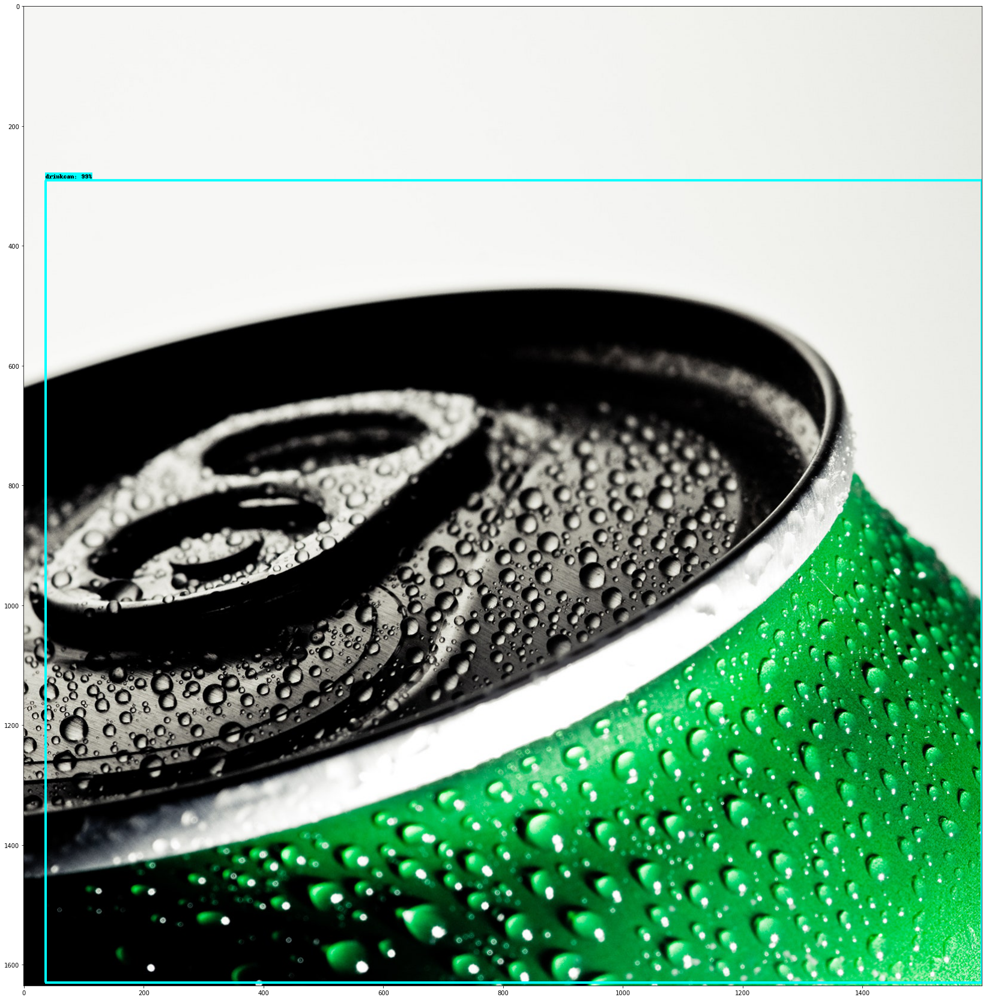

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can107.jpg


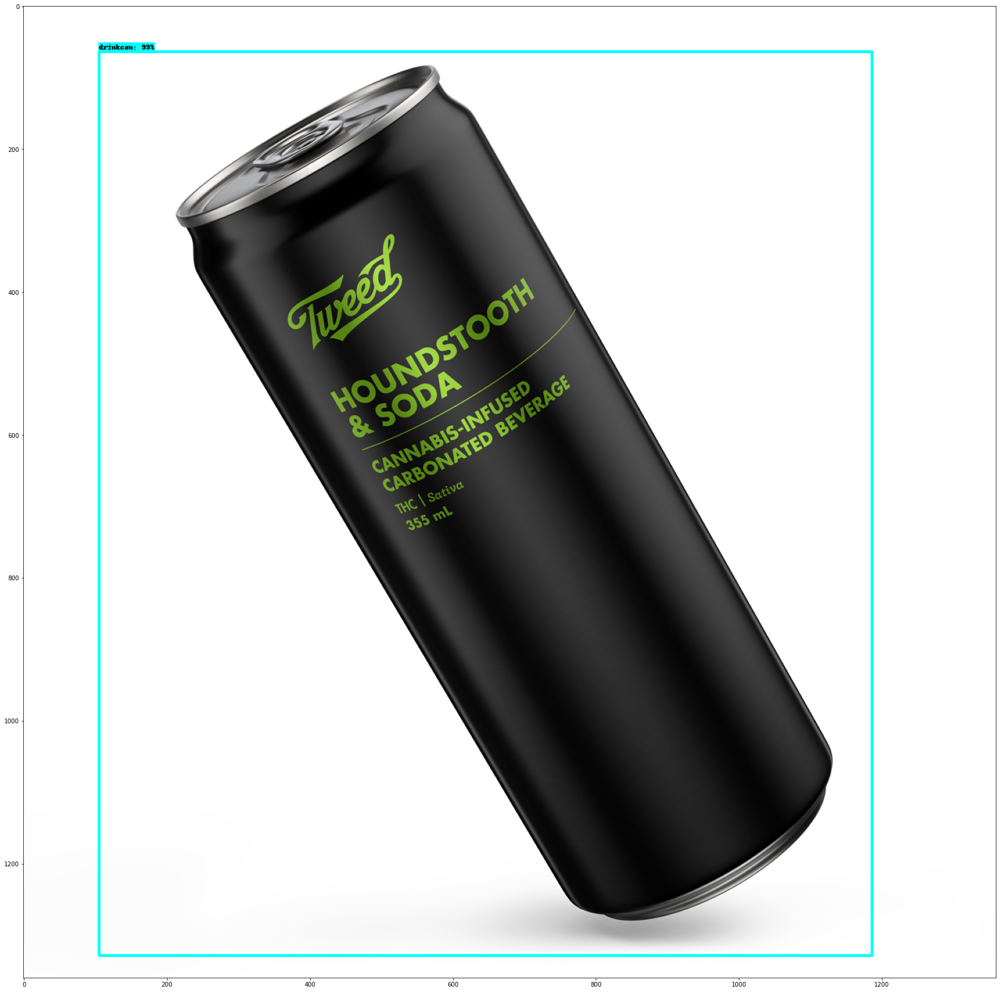

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can109.jpg


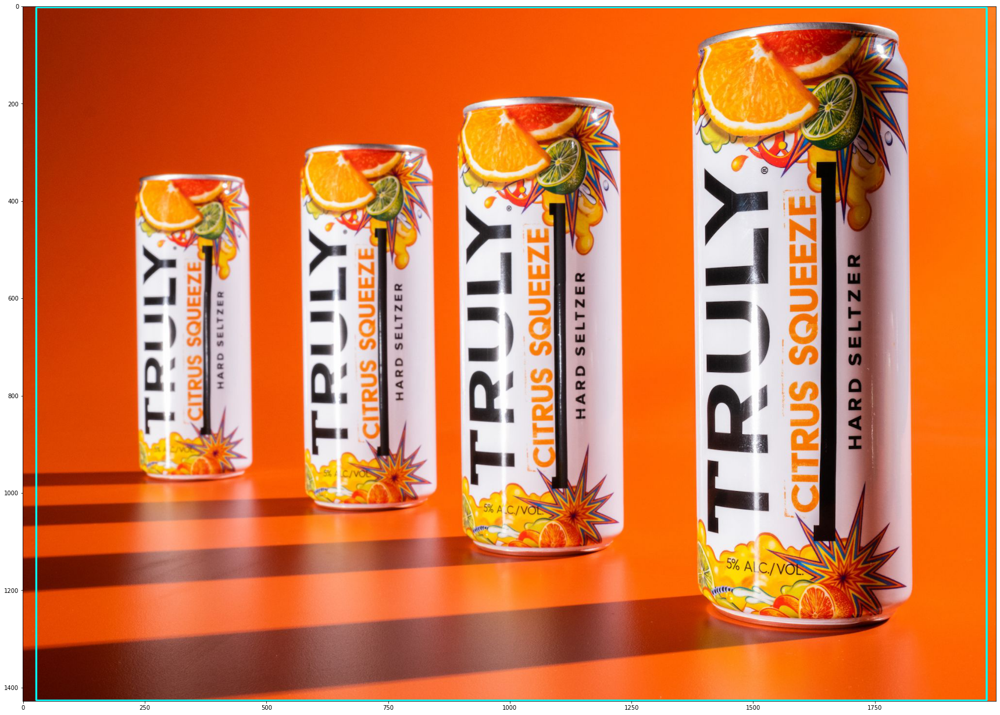

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can108.jpg


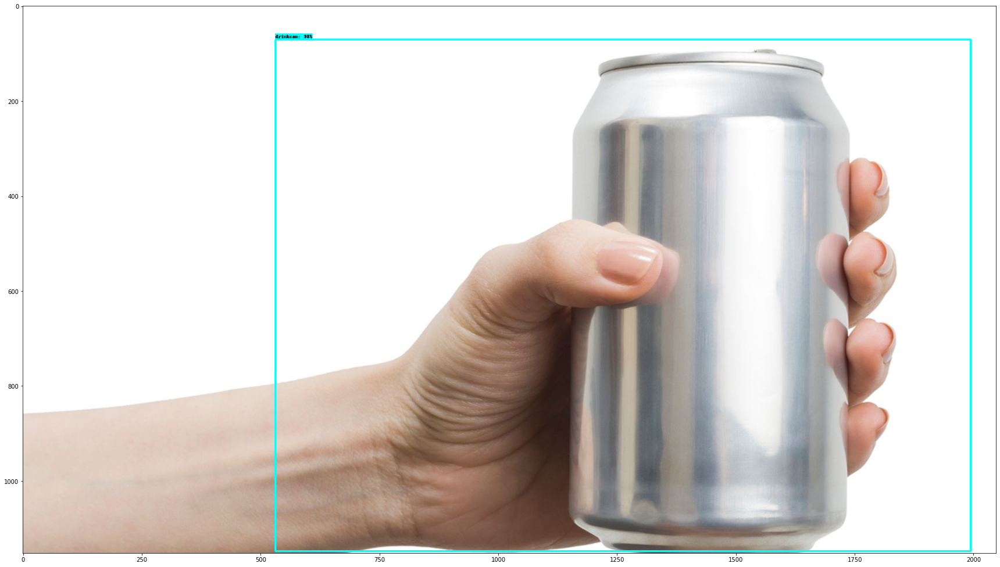

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can102.jpg


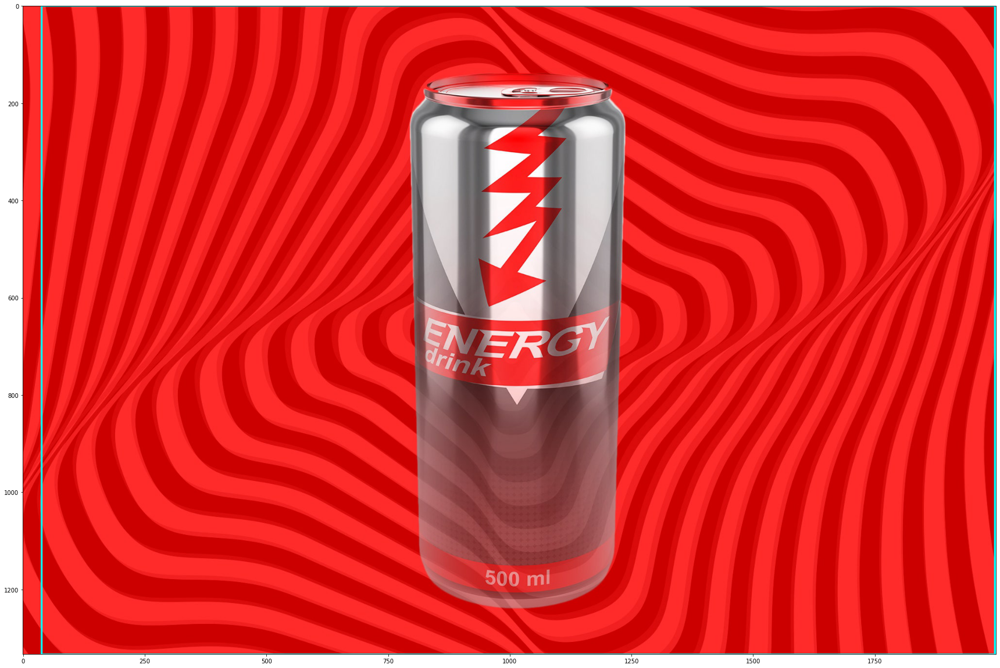

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can100.jpg


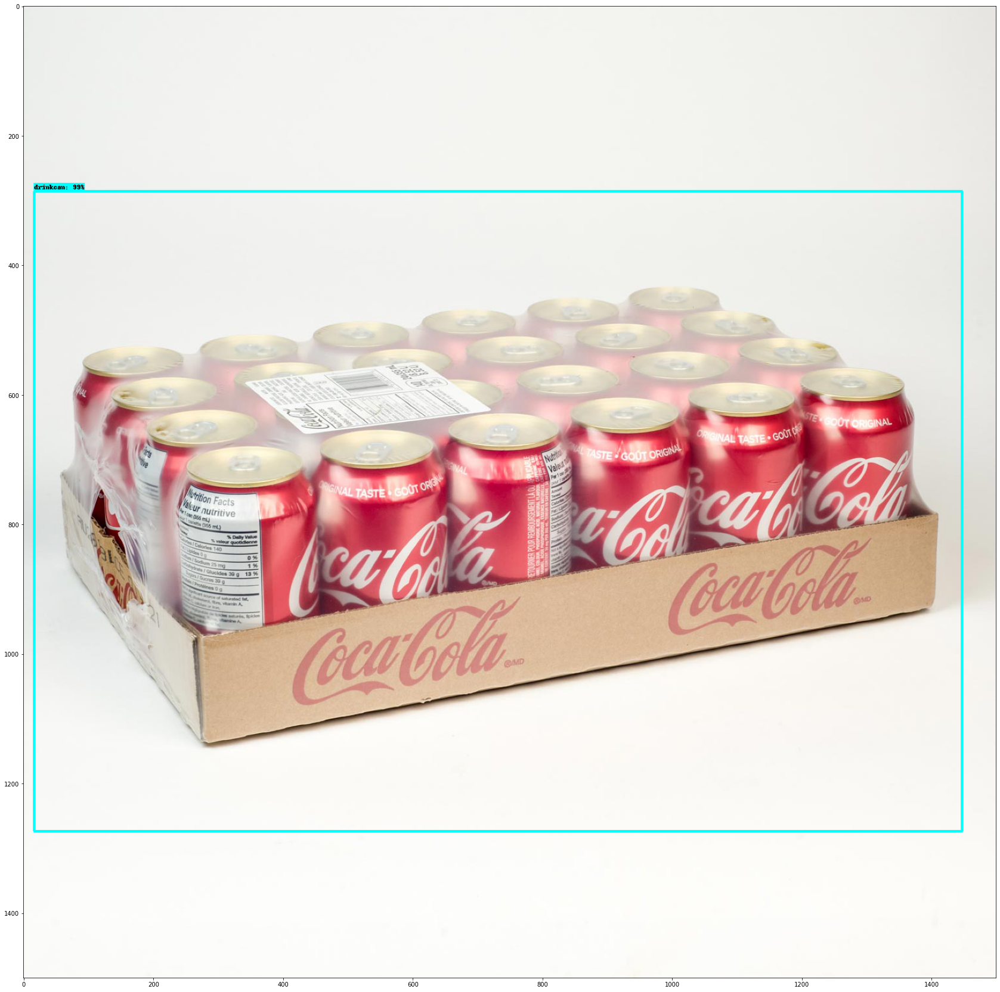

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can104.jpg


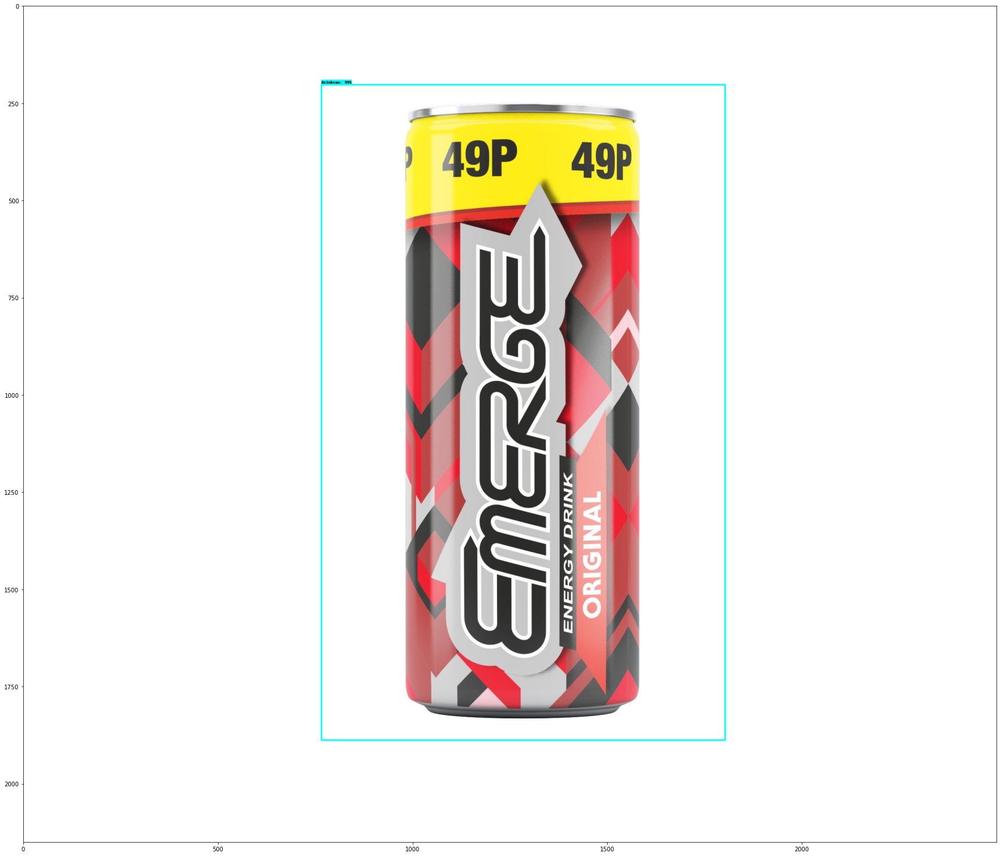

/content/gdrive/MyDrive/Juice_Box/Test_Images/drink_can/drink_can101.jpg


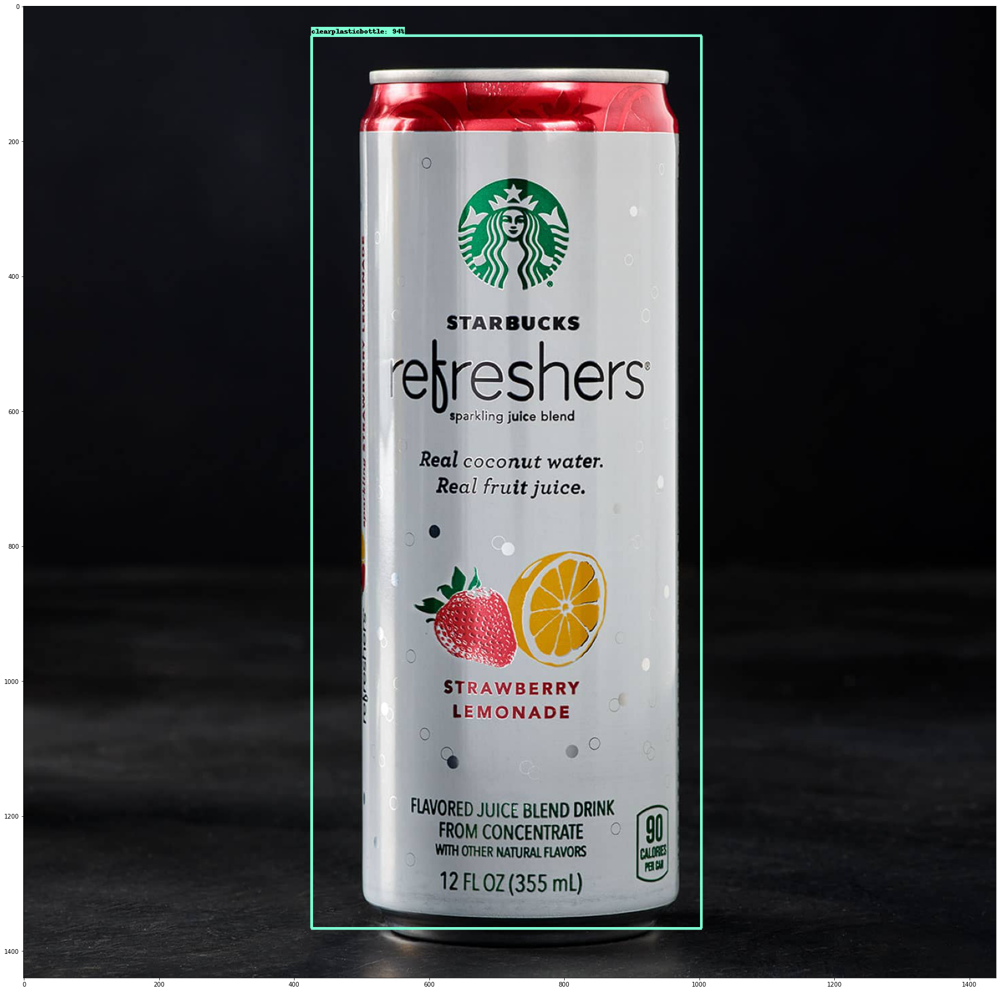

In [ ]:
%cd /content/models/research/object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops


from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util

detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')


label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(
    label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (30, 30)


def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,
                                   feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(
                output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
                'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict

%matplotlib inline

for image_path in TEST_IMAGE_PATHS:
  try:
    image = Image.open(image_path)
    print(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=4,
        min_score_thresh=.5)
    plt.figure(figsize=(IMAGE_SIZE))
    plt.imshow(image_np)
    plt.show()
  except Exception:
    pass